###  Importing libraries

In [0]:
#Importing Libraries
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, sum as _sum, to_date, lit,date_format
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, FloatType
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pyspark.sql import SparkSession
from pyspark.sql.window import Window
from pyspark.sql.functions import col, sum, rank, round, max, avg, to_date, datediff, floor
from pyspark.sql.window import Window

## Initializing spark session and Defining schema

In [0]:
# Initialize Spark session
spark = SparkSession.builder.appName("Bank Customer Segmentation").getOrCreate()

# Define schema
schema = StructType([
    StructField("TransactionID", StringType(), True),
    StructField("CustomerID", StringType(), True),
    StructField("CustomerDOB", StringType(), True),
    StructField("CustGender", StringType(), True),
    StructField("CustLocation", StringType(), True),
    StructField("CustAccountBalance", FloatType(), True),
    StructField("TransactionDate", StringType(), True),
    StructField("TransactionTime", StringType(), True),
    StructField("TransactionAmount", FloatType(), True)
])

In [0]:
%fs ls /FileStore/tables/bank_transactions.csv

path,name,size,modificationTime
dbfs:/FileStore/tables/bank_transactions.csv,bank_transactions.csv,67564190,1742401028000


###  Caching and printing schema

In [0]:

bank_df = spark.read.csv("dbfs:/FileStore/tables/bank_transactions.csv", header = True, 
                        schema = schema )
bank_df.cache()
bank_df.printSchema()

root
 |-- TransactionID: string (nullable = true)
 |-- CustomerID: string (nullable = true)
 |-- CustomerDOB: string (nullable = true)
 |-- CustGender: string (nullable = true)
 |-- CustLocation: string (nullable = true)
 |-- CustAccountBalance: float (nullable = true)
 |-- TransactionDate: string (nullable = true)
 |-- TransactionTime: string (nullable = true)
 |-- TransactionAmount: float (nullable = true)



In [0]:
bank_df.display()

TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount
T1,C5841053,10/1/94,F,JAMSHEDPUR,17819.05,2/8/16,143207,25.0
T2,C2142763,4/4/57,M,JHAJJAR,2270.69,2/8/16,141858,27999.0
T3,C4417068,26/11/96,F,MUMBAI,17874.44,2/8/16,142712,459.0
T4,C5342380,14/9/73,F,MUMBAI,866503.2,2/8/16,142714,2060.0
T5,C9031234,24/3/88,F,NAVI MUMBAI,6714.43,2/8/16,181156,1762.5
T6,C1536588,8/10/72,F,ITANAGAR,53609.2,2/8/16,173940,676.0
T7,C7126560,26/1/92,F,MUMBAI,973.46,2/8/16,173806,566.0
T8,C1220223,27/1/82,M,MUMBAI,95075.54,2/8/16,170537,148.0
T9,C8536061,19/4/88,F,GURGAON,14906.96,2/8/16,192825,833.0
T10,C6638934,22/6/84,M,MUMBAI,4279.22,2/8/16,192446,289.11


###  Changing date format

In [0]:
# Convert date columns to date type
bank_df = bank_df.withColumn("CustomerDOB", to_date(col("CustomerDOB"), "d/M/yy"))

bank_df = bank_df.withColumn("TransactionDate", to_date(col("TransactionDate"), "d/M/yy"))
                           

In [0]:

bank_df.display()

TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount
T1,C5841053,1994-01-10,F,JAMSHEDPUR,17819.05,2016-08-02,143207,25.0
T2,C2142763,1957-04-04,M,JHAJJAR,2270.69,2016-08-02,141858,27999.0
T3,C4417068,1996-11-26,F,MUMBAI,17874.44,2016-08-02,142712,459.0
T4,C5342380,1973-09-14,F,MUMBAI,866503.2,2016-08-02,142714,2060.0
T5,C9031234,1988-03-24,F,NAVI MUMBAI,6714.43,2016-08-02,181156,1762.5
T6,C1536588,1972-10-08,F,ITANAGAR,53609.2,2016-08-02,173940,676.0
T7,C7126560,1992-01-26,F,MUMBAI,973.46,2016-08-02,173806,566.0
T8,C1220223,1982-01-27,M,MUMBAI,95075.54,2016-08-02,170537,148.0
T9,C8536061,1988-04-19,F,GURGAON,14906.96,2016-08-02,192825,833.0
T10,C6638934,1984-06-22,M,MUMBAI,4279.22,2016-08-02,192446,289.11


### Handling missing values and removing unrealistic values

In [0]:

# Handle missing values by filling them with 0
bank_df = bank_df.fillna({"CustAccountBalance": 0, "TransactionAmount": 0})

# Filter out unrealistic DOBs
bank_df = bank_df.filter(col("CustomerDOB") > lit("1900-01-01"))

bank_df.display()

TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount
T1,C5841053,1994-01-10,F,JAMSHEDPUR,17819.05,2016-08-02,143207,25.0
T2,C2142763,1957-04-04,M,JHAJJAR,2270.69,2016-08-02,141858,27999.0
T3,C4417068,1996-11-26,F,MUMBAI,17874.44,2016-08-02,142712,459.0
T4,C5342380,1973-09-14,F,MUMBAI,866503.2,2016-08-02,142714,2060.0
T5,C9031234,1988-03-24,F,NAVI MUMBAI,6714.43,2016-08-02,181156,1762.5
T6,C1536588,1972-10-08,F,ITANAGAR,53609.2,2016-08-02,173940,676.0
T7,C7126560,1992-01-26,F,MUMBAI,973.46,2016-08-02,173806,566.0
T8,C1220223,1982-01-27,M,MUMBAI,95075.54,2016-08-02,170537,148.0
T9,C8536061,1988-04-19,F,GURGAON,14906.96,2016-08-02,192825,833.0
T10,C6638934,1984-06-22,M,MUMBAI,4279.22,2016-08-02,192446,289.11


### Define Business Insights
Let's define seven key business insights we want to derive from the data:

- Total Transaction Amount per Customer Location (Filter, Projection, Group By).
- Top 3 Customers by Transaction Amount in Each Location (Partition Over Ranking Function).
- Moving Average of Transaction Amount for Each Customer (Moving Average).
- Gender-wise distribution of transactions.
- Average account balance per location.
- Highest transaction amount per day.
- Customer age distribution.

In [0]:
df_clean = bank_df.filter(bank_df["CustomerID"].isNotNull() & bank_df["CustLocation"].isNotNull() & bank_df["TransactionAmount"].isNotNull())

In [0]:

# Assuming your DataFrame is named df_clean and the transaction date column is named TransactionDate

# Get the latest transaction date to get age by subtracting it from customer DOB
latest_transaction_date = df_clean.agg(max("TransactionDate").alias("LatestTransactionDate")).collect()[0]["LatestTransactionDate"]

print(f"The latest transaction date is: {latest_transaction_date}")

The latest transaction date is: 2016-10-21


In [0]:
# Group by CustLocation and calculate the total transaction amount rounded to 2 decimal places
location_transaction_amount = df_clean.groupBy("CustLocation") \
    .agg(round(sum("TransactionAmount"), 2).alias("TotalTransactionAmount"))

# Convert to Pandas DataFrame for plotting
location_transaction_amount_pd = location_transaction_amount.toPandas()
location_transaction_amount_pd = location_transaction_amount_pd.sort_values(by="TotalTransactionAmount", ascending=False).head(20)
     

In [0]:
location_transaction_amount_pd.head()

,CustLocation,TotalTransactionAmount
4213,MUMBAI,1.622702e+08
243,NEW DELHI,1.308523e+08
1220,BANGALORE,1.055710e+08
3391,GURGAON,1.012430e+08
1219,DELHI,9.346726e+07


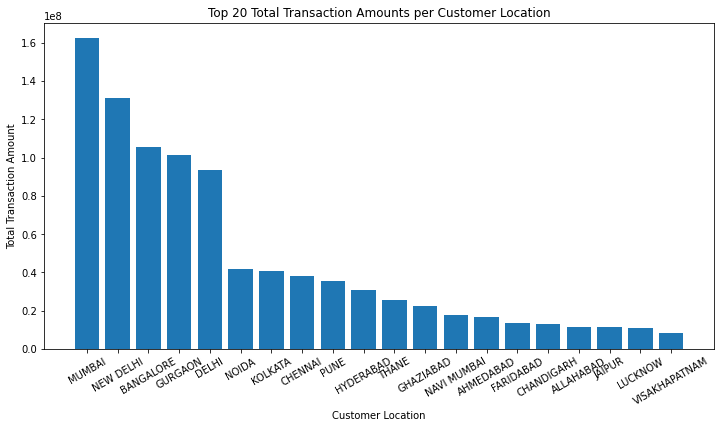

In [0]:
plt.figure(figsize=(12, 6))
plt.bar(location_transaction_amount_pd['CustLocation'], location_transaction_amount_pd['TotalTransactionAmount'])
plt.xlabel('Customer Location')
plt.ylabel('Total Transaction Amount')
plt.title('Top 20 Total Transaction Amounts per Customer Location')
plt.xticks(rotation=30)
plt.show()

### Inference:
This insight helps in identifying which locations generate the highest and lowest transaction amounts.
This can guide businesses in making location-specific strategies such as targeted marketing campaigns, resource allocation, and identifying regions that may need additional support or development efforts

In [0]:
# Step 1: Group by CustLocation and CustomerID, then calculate the total transaction amount
location_customer_transaction = df_clean.groupBy("CustLocation", "CustomerID") \
    .agg(sum("TransactionAmount").alias("TotalTransactionAmount"))

# Step 2: Use a window function to rank the customers by transaction amount within each location
window_spec = Window.partitionBy("CustLocation").orderBy(col("TotalTransactionAmount").desc())
location_customer_transaction = location_customer_transaction.withColumn("rank", rank().over(window_spec))

# Step 3: Filter to get the top 3 customers in each location
top_3_customers_per_location = location_customer_transaction.filter(col("rank") <= 3)

# Step 4: Convert the resulting DataFrame to Pandas for plotting
top_3_customers_per_location_pd = top_3_customers_per_location.toPandas()

In [0]:
top_3_customers_per_location_pd.head()

,CustLocation,CustomerID,TotalTransactionAmount,rank
0,(N) 24 PGS,C8966067,2400.0,1
1,(N) 24 PGS,C2966067,1867.0,2
2,(N) 24 PGS,C1166072,1750.0,3
3,(VIA) SALEM,C6134174,3898.0,1
4,(VIA) SALEM,C8134142,3898.0,1


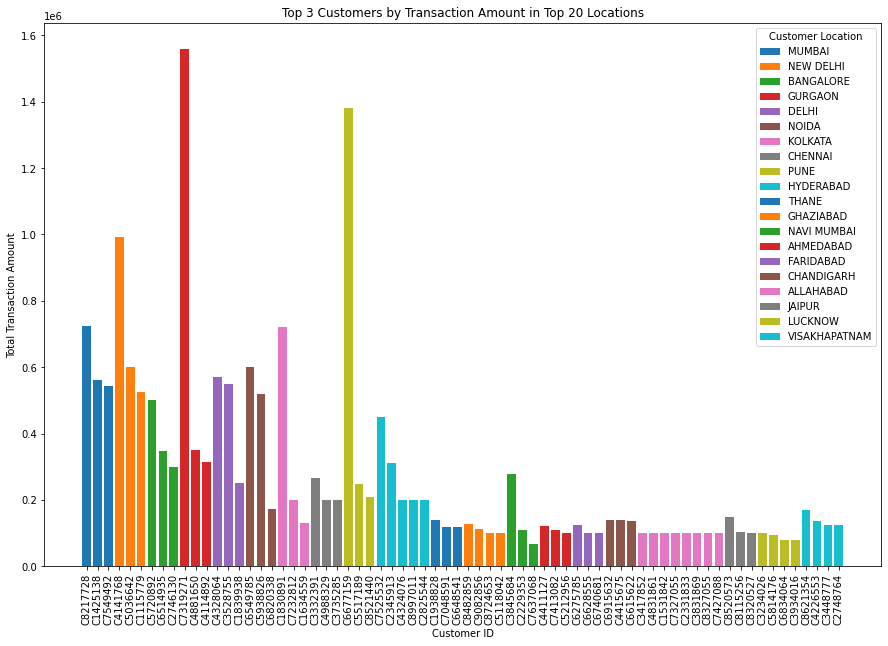

In [0]:
# Step 5: Plot the data
plt.figure(figsize=(15, 10))

# Iterate through each unique location and plot the top 3 customers
for location in location_transaction_amount_pd['CustLocation'].unique():
    location_data = top_3_customers_per_location_pd[top_3_customers_per_location_pd['CustLocation'] == location]
    plt.bar(location_data['CustomerID'], location_data['TotalTransactionAmount'], label=location)

plt.xlabel('Customer ID')
plt.ylabel('Total Transaction Amount')
plt.title('Top 3 Customers by Transaction Amount in Top 20 Locations')
plt.xticks(rotation=90)
plt.legend(title='Customer Location')
plt.show()

### Inference:
This insight reveals the most valuable customers in each location, allowing businesses to focus on retaining and nurturing these top customers.
This can be done through personalized offers, loyalty programs, and enhanced customer service. It also highlights which locations have high-value customers.

In [0]:
# Define window specification for moving average
window_spec = Window.partitionBy("CustomerID").orderBy("TransactionDate").rowsBetween(-2, 0)

# Calculate moving average
moving_avg_df = df_clean.withColumn("MovingAvgTransactionAmount", avg("TransactionAmount").over(window_spec))

# Show the result
moving_avg_df.display()

TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount,MovingAvgTransactionAmount
T401396,C1010024,1965-06-21,M,KOLKATA,87058.65,2016-08-18,141103,5000.0,5000.0
T303294,C1010068,1976-07-14,M,GURGAON,46741.73,2016-08-10,101617,546.0,546.0
T113706,C1010081,1984-02-11,F,HOWRAH,17.71,2016-08-06,145828,2856.0,2856.0
T347496,C1010081,1989-05-01,M,GHAZIABAD,1584.18,2016-08-14,144742,429.0,1642.5
T329017,C1010081,1977-09-02,F,PANCHKULA,23319.04,2016-08-15,172658,1699.0,1661.3333333333333
T285433,C1010087,1990-04-20,M,MUMBAI,8346.99,2016-08-11,122201,42.0,42.0
T260395,C1010116,1994-01-30,M,HYDERABAD,12299.04,2016-08-12,184629,40.0,40.0
T749269,C1010122,1988-09-05,F,NOIDA,312.39,2016-09-01,214152,5090.0,5090.0
T97653,C1010241,1985-10-09,F,PUNE,27952.37,2016-08-01,161930,22.0,22.0
T67009,C1010243,1980-03-01,M,TEHRI GARHWAL,149425.48,2016-08-02,115427,253.0,253.0


### Inference:
This insight helps in understanding the transaction trends of individual customers over time. The moving average smoothens short-term fluctuations and highlights longer-term trends.
Businesses can use this to identify changes in customer behavior, spot potential churn risks, and tailor marketing strategies accordingly.

In [0]:
# Filter by gender and calculate average transaction amount
average_transaction_amount_f = df_clean.filter(col("CustGender") == "F").agg(avg("TransactionAmount").alias("AverageTransactionAmount")).collect()
average_transaction_amount_m = df_clean.filter(col("CustGender") == "M").agg(avg("TransactionAmount").alias("AverageTransactionAmount")).collect()
     

  CustGender  AverageTransactionAmount
0          F               1599.863201
1          M               1397.656467


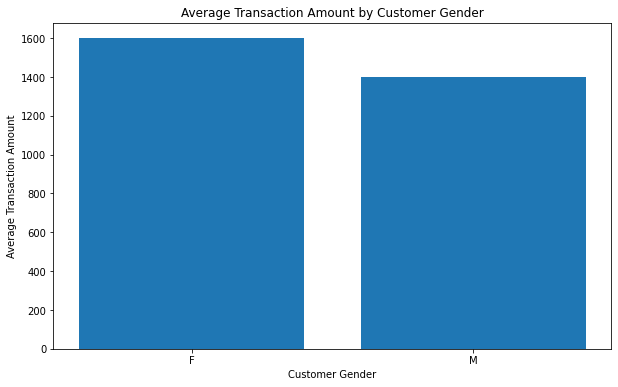

In [0]:
# Convert results to pandas DataFrame for plotting
average_transaction_amount_pd = pd.DataFrame({
    "CustGender": ["F", "M"],
    "AverageTransactionAmount": [average_transaction_amount_f[0]["AverageTransactionAmount"], average_transaction_amount_m[0]["AverageTransactionAmount"]]
})

# Print the result
print(average_transaction_amount_pd)

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(average_transaction_amount_pd['CustGender'], average_transaction_amount_pd['AverageTransactionAmount'])
plt.xlabel('Customer Gender')
plt.ylabel('Average Transaction Amount')
plt.title('Average Transaction Amount by Customer Gender')
plt.xticks(rotation=0)
plt.show()
     

### Inference:
This insight reveals the spending patterns across different genders. Businesses can leverage this information to create gender-specific marketing strategies and promotions.
Understanding gender-wise transaction distribution helps in better product positioning and customer segmentation.

In [0]:
# Define the current date (2016-10-21) as last transaction date is 2016-10-21
current_date = '2016-10-21'

# Convert CustomerDOB to date format
df_clean = df_clean.withColumn('CustomerDOB', to_date(col('CustomerDOB'), 'dd-MM-yyyy'))

# Calculate age
df_clean = df_clean.withColumn('Age', floor(datediff(to_date(lit(current_date)), col('CustomerDOB')) / 365))

# Show the resulting DataFrame
df_clean.select('CustomerID', 'CustomerDOB', 'Age').show()

+----------+-----------+---+
|CustomerID|CustomerDOB|Age|
+----------+-----------+---+
|  C5841053| 1994-01-10| 22|
|  C2142763| 1957-04-04| 59|
|  C4417068| 1996-11-26| 19|
|  C5342380| 1973-09-14| 43|
|  C9031234| 1988-03-24| 28|
|  C1536588| 1972-10-08| 44|
|  C7126560| 1992-01-26| 24|
|  C1220223| 1982-01-27| 34|
|  C8536061| 1988-04-19| 28|
|  C6638934| 1984-06-22| 32|
|  C5430833| 1982-07-22| 34|
|  C6939838| 1988-07-07| 28|
|  C6339347| 1978-06-13| 38|
|  C8327851| 1992-01-05| 24|
|  C7917151| 1978-03-24| 38|
|  C8334633| 1968-07-10| 48|
|  C8967349| 1989-07-16| 27|
|  C3732016| 1991-01-11| 25|
|  C8999019| 1985-06-24| 31|
|  C6121429| 1993-04-20| 23|
+----------+-----------+---+
only showing top 20 rows



In [0]:
# Filter out below 18 Customers
df_clean = df_clean.filter(col('Age') >= 18)

# Group by Age and calculate the total transaction amount
age_transaction_amount = df_clean.groupBy('Age') \
    .agg(_sum('TransactionAmount').alias('TotalTransactionAmount'))

# Sort by Age in ascending order
age_transaction_amount_sorted = age_transaction_amount.orderBy('Age')
age_transaction_amount_sorted.show()

+---+----------------------+
|Age|TotalTransactionAmount|
+---+----------------------+
| 18|     3379760.639811814|
| 19|     6185261.208389897|
| 20|  1.0194237732445717E7|
| 21|  1.6998749389118526E7|
| 22|   3.082338360715559E7|
| 23|  4.8184861210766725E7|
| 24|  5.7853079700623326E7|
| 25|   7.015013450244173E7|
| 26|   7.443658823330972E7|
| 27|   7.635318123033693E7|
| 28|   7.892949530817592E7|
| 29|   7.550104069000062E7|
| 30|   7.031162741152465E7|
| 31|    7.19741072724357E7|
| 32|  5.9886382874821745E7|
| 33|   5.964563159685418E7|
| 34|   5.152132211598749E7|
| 35|   4.524229655536425E7|
| 36|   4.480336661406404E7|
| 37|  4.1957260750810504E7|
+---+----------------------+
only showing top 20 rows



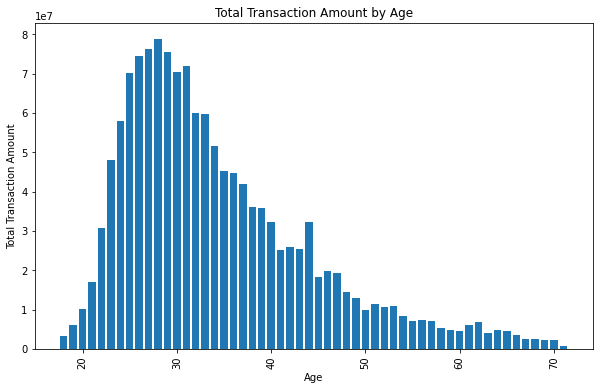

In [0]:
# Convert to Pandas DataFrame for plotting
age_transaction_amount_pd = age_transaction_amount_sorted.toPandas()

# Plotting the total transaction amount for each age
plt.figure(figsize=(10, 6))
plt.bar(age_transaction_amount_pd['Age'], age_transaction_amount_pd['TotalTransactionAmount'])
plt.xlabel('Age')
plt.ylabel('Total Transaction Amount')
plt.title('Total Transaction Amount by Age')
plt.xticks(rotation=90)
plt.show()

### Inference:
This insight provides information on the average financial standing of customers across different locations.
It can help businesses identify regions with high or low financial activity and tailor their services accordingly.
For instance, areas with higher average balances might be targeted with premium services or investment opportunities.

In [0]:
# Group by Age and Gender, and calculate the total transaction amount
age_gender_transaction_amount = df_clean.groupBy('Age', 'CustGender') \
    .agg(_sum('TransactionAmount').alias('TotalTransactionAmount'))

# Sort by Age in ascending order
age_gender_transaction_amount_sorted = age_gender_transaction_amount.orderBy('Age', 'CustGender')

# Convert to Pandas DataFrame for plotting
age_gender_transaction_amount_pd = age_gender_transaction_amount_sorted.toPandas()
age_gender_transaction_amount_sorted.show()

+---+----------+----------------------+
|Age|CustGender|TotalTransactionAmount|
+---+----------+----------------------+
| 18|         F|     662546.2903535366|
| 18|         M|     2717214.349458277|
| 19|         F|    1752010.9309357405|
| 19|         M|     4433250.277454156|
| 20|         F|     2732522.531746626|
| 20|         M|     7461715.200699091|
| 21|         F|     5960250.482523799|
| 21|         M|  1.1038498906594727E7|
| 22|         F|   1.140652625813374E7|
| 22|         M|  1.9416857349021852E7|
| 23|         F|   2.019187832913637E7|
| 23|         M|  2.7992982881630354E7|
| 24|         F|  2.1275710342226267E7|
| 24|         M|   3.657736935839706E7|
| 25|         F|  2.6947458542297393E7|
| 25|         M|   4.320267596014433E7|
| 26|         F|  2.6755852958956063E7|
| 26|         M|   4.768073527435365E7|
| 27|         F|  2.6653051630580485E7|
| 27|         M|   4.970012959975645E7|
+---+----------+----------------------+
only showing top 20 rows



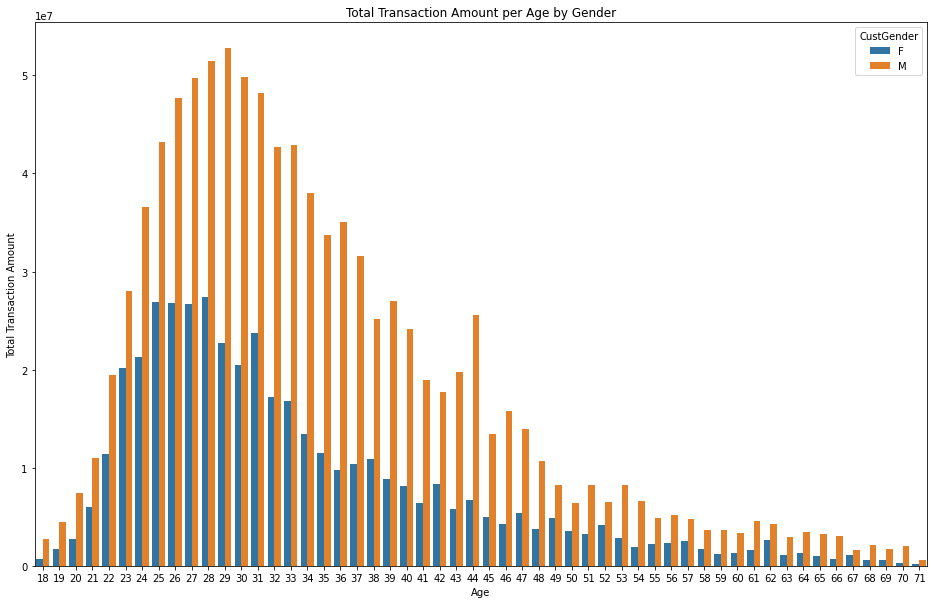

In [0]:
# Plotting the total transaction amount for each age by gender
plt.figure(figsize=(16, 10))
sns.barplot(data=age_gender_transaction_amount_pd, x='Age', y='TotalTransactionAmount', hue='CustGender')
plt.xlabel('Age')
plt.ylabel('Total Transaction Amount')
plt.title('Total Transaction Amount per Age by Gender')
plt.xticks()
plt.legend(title='CustGender')
plt.show()

### Inference:
This insight highlights the maximum transaction amounts recorded each day.
It helps businesses identify peak transaction days and understand the factors contributing to these peaks.
This can be useful for planning promotions, understanding customer behavior patterns, and managing resources effectively.

In [0]:
# Group by Age and Gender, and calculate the total CustAccountBalance amount
age_gender_CustAccountBalance = df_clean.groupBy('Age', 'CustGender') \
    .agg(_sum('CustAccountBalance').alias('TotalCustAccountBalance'))

# Sort by Age in ascending order
age_gender_CustAccountBalance_sorted = age_gender_CustAccountBalance.orderBy('Age', 'CustGender')

# Convert to Pandas DataFrame for plotting
age_gender_CustAccountBalance_pd = age_gender_CustAccountBalance_sorted.toPandas()
age_gender_CustAccountBalance_sorted.show()

+---+----------+-----------------------+
|Age|CustGender|TotalCustAccountBalance|
+---+----------+-----------------------+
| 18|         F|   3.0245806736161232E7|
| 18|         M|    5.000464518670202E7|
| 19|         F|   5.5995510823536694E7|
| 19|         M|   1.4203094643334365E8|
| 20|         F|    1.101503582274856E8|
| 20|         M|    3.039904318946406E8|
| 21|         F|    2.387002526357839E8|
| 21|         M|      3.6448499066074E8|
| 22|         F|    3.361121654932011E8|
| 22|         M|    6.864839499874172E8|
| 23|         F|     6.57996479907857E8|
| 23|         M|   1.0178061091027538E9|
| 24|         F|    8.469860601696023E8|
| 24|         M|    1.934766203987327E9|
| 25|         F|   1.0653341436048687E9|
| 25|         M|   1.8541643955395005E9|
| 26|         F|   1.1586133727201886E9|
| 26|         M|   2.5660321843717723E9|
| 27|         F|   1.2459945832014015E9|
| 27|         M|    3.200705747092247E9|
+---+----------+-----------------------+
only showing top

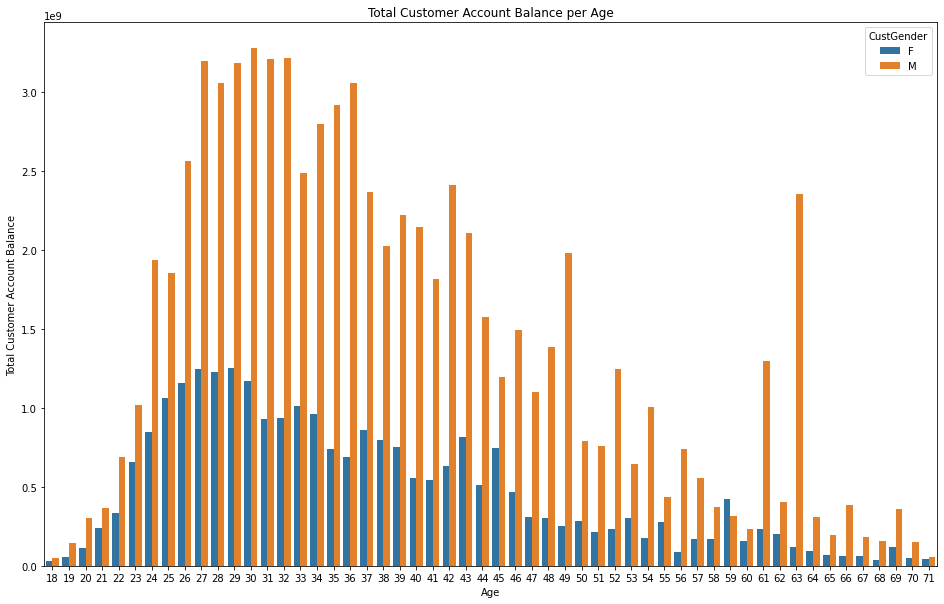

In [0]:
# Plotting the total transaction amount for each age by gender
plt.figure(figsize=(16, 10))
sns.barplot(data=age_gender_CustAccountBalance_pd, x='Age', y='TotalCustAccountBalance', hue='CustGender')
plt.xlabel('Age')
plt.ylabel('Total Customer Account Balance')
plt.title('Total Customer Account Balance per Age')
plt.xticks()
plt.legend(title='CustGender')
plt.show()

### Inference:
This insight reveals the age distribution of customers.
Understanding the age demographics helps businesses tailor their products, services, and marketing strategies to suit different age groups.
For example, younger age groups might prefer more tech-savvy solutions, while older age groups might value more traditional services.
This demographic analysis is crucial for market segmentation and targeting.

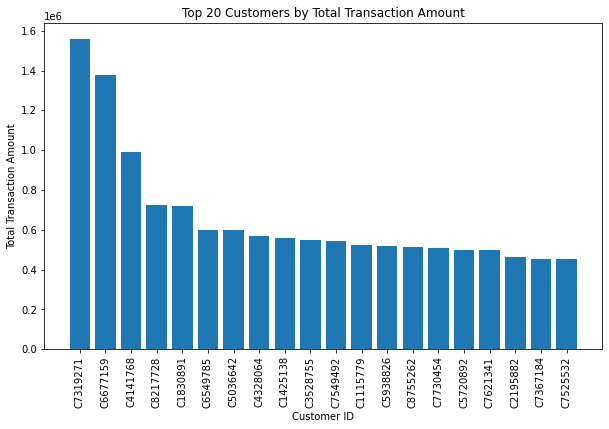

In [0]:
# Assuming 'total_transaction_amount_pd' is a DataFrame with customer transaction data

# Filter unrealistic dates and fill missing values
df_filtered = bank_df.filter(col("CustomerDOB") > lit("1900-01-01"))
df_filtered = df_filtered.fillna({"CustAccountBalance": 0, "TransactionAmount": 0})

# Calculate total transaction amount per customer
total_transaction_amount = df_filtered.groupBy("CustomerID").sum("TransactionAmount")
total_transaction_amount_pd = total_transaction_amount.toPandas()

# Select top N customers by transaction amount
top_n = 20
top_customers = total_transaction_amount_pd.nlargest(top_n, 'sum(TransactionAmount)')

# Plot the top N customers
plt.figure(figsize=(10, 6))
plt.bar(top_customers['CustomerID'], top_customers['sum(TransactionAmount)'])
plt.xlabel('Customer ID')
plt.ylabel('Total Transaction Amount')
plt.title('Top {} Customers by Total Transaction Amount'.format(top_n))
plt.xticks(rotation=90)
plt.show()